In [1]:
import pandas as pd
import numpy as np
import datetime as dt
import math

In [2]:
ticker = 'IVV.US'
sd = dt.date(2007, 1, 1)
ed = dt.date(2024, 4, 30)

In [ ]:
intra_data = pd.read_parquet(f'data/{ticker}.parquet')
daily_data = pd.read_parquet(f'data/{ticker}.daily.parquet')
div_data = pd.read_parquet(f'data/{ticker}.div.parquet')

In [4]:
intra_data = intra_data[(intra_data.date >= sd) & (intra_data.date <= ed)].rename(columns={'datetime' :'caldt'})
daily_data = daily_data[(daily_data.date >= sd) & (daily_data.date <= ed)].rename(columns={'date' :'caldt', ticker: 'close'})
dividends = div_data[(div_data.date >= sd) & (div_data.date <= ed)].rename(columns={'date' :'caldt', ticker: 'dividend'})

In [5]:
# Load the intraday data into a DataFrame and set the datetime column as the index.
df = pd.DataFrame(intra_data)
df['day'] = pd.to_datetime(df['caldt']).dt.date  # Extract the date part from the datetime for daily analysis.
df.set_index('caldt', inplace=True)  # Setting the datetime as the index for easier time series manipulation.

# Group the DataFrame by the 'day' column to facilitate operations that need daily aggregation.
daily_groups = df.groupby('day')

# Extract unique days from the dataset to iterate through each day for processing.
all_days = df['day'].unique()

# Initialize new columns to store calculated metrics, starting with NaN for absence of initial values.
df['move_open'] = np.nan  # To record the absolute daily change from the open price
df['vwap'] = np.nan       # To calculate the Volume Weighted Average Price.
df['spy_dvol'] = np.nan   # To record SPY's daily volatility.

# Create a series to hold computed daily returns for SPY, initialized with NaN.
spy_ret = pd.Series(index=all_days, dtype=float)

# Iterate through each day to calculate metrics.
for d in range(1, len(all_days)):
    current_day = all_days[d]
    prev_day = all_days[d - 1]

    # Access the data for the current and previous days using their groups.
    current_day_data = daily_groups.get_group(current_day)
    prev_day_data = daily_groups.get_group(prev_day)

    # Calculate the average of high, low, and close prices.
    hlc = (current_day_data['high'] + current_day_data['low'] + current_day_data['close']) / 3

    # Compute volume-weighted metrics for VWAP calculation.
    vol_x_hlc = current_day_data['volume'] * hlc
    cum_vol_x_hlc = vol_x_hlc.cumsum()  # Cumulative sum for VWAP calculation.
    cum_volume = current_day_data['volume'].cumsum()

    # Assign the calculated VWAP to the corresponding index in the DataFrame.
    df.loc[current_day_data.index, 'vwap'] = cum_vol_x_hlc / cum_volume

    # Calculate the absolute percentage change from the day's opening price.
    open_price = current_day_data['open'].iloc[0]
    df.loc[current_day_data.index, 'move_open'] = (current_day_data['close'] / open_price - 1).abs()

    # Compute the daily return for SPY using the closing prices from the current and previous day.
    spy_ret.loc[current_day] = current_day_data['close'].iloc[-1] / prev_day_data['close'].iloc[-1] - 1

    # Calculate the 15-day rolling volatility, starting calculation after accumulating 15 days of data.
    if d > 14:
        df.loc[current_day_data.index, 'spy_dvol'] = spy_ret.iloc[d - 15:d - 1].std(skipna=False)

# Calculate the minutes from market open and determine the minute of the day for each timestamp.
df['min_from_open'] = ((df.index - df.index.normalize()) / pd.Timedelta(minutes=1)) - (9 * 60 + 30) + 1
df['minute_of_day'] = df['min_from_open'].round().astype(int)

# Group data by 'minute_of_day' for minute-level calculations.
minute_groups = df.groupby('minute_of_day')

# Calculate rolling mean and delayed sigma for each minute of the trading day.
df['move_open_rolling_mean'] = minute_groups['move_open'].transform(lambda x: x.rolling(window=14, min_periods=13).mean())
df['sigma_open'] = minute_groups['move_open_rolling_mean'].transform(lambda x: x.shift(1))

# Convert dividend dates to datetime and merge dividend data based on trading days.
dividends['day'] = pd.to_datetime(dividends['caldt']).dt.date
df = df.merge(dividends[['day', 'dividend']], on='day', how='left')
df['dividend'] = df['dividend'].fillna(0)  # Fill missing dividend data with 0.

In [6]:
# Constants and settings
AUM_0 = 100000.0
commission = 0.0035
min_comm_per_order = 0.35
band_mult = 1
band_simplified = 0
trade_freq = 30
sizing_type = "vol_target"
target_vol = 0.02
max_leverage = 4


# Group data by day for faster access
daily_groups = df.groupby('day')

# Initialize strategy DataFrame using unique days
strat = pd.DataFrame(index=all_days)
strat['ret'] = np.nan
strat['AUM'] = AUM_0
strat['ret_spy'] = np.nan

# Calculate daily returns for SPY using the closing prices
df_daily = pd.DataFrame(daily_data)
df_daily['caldt'] = pd.to_datetime(df_daily['caldt']).dt.date
df_daily.set_index('caldt', inplace=True)  # Set the datetime column as the DataFrame index for easy time series manipulation.

df_daily['ret'] = df_daily['close'].diff() / df_daily['close'].shift()

In [15]:

# Loop through all days, starting from the second day
for d in range(1, len(all_days)):
    current_day = all_days[d]
    prev_day = all_days[d-1]
    
    if prev_day in daily_groups.groups and current_day in daily_groups.groups:
        prev_day_data = daily_groups.get_group(prev_day)
        current_day_data = daily_groups.get_group(current_day)

        if 'sigma_open' in current_day_data.columns and current_day_data['sigma_open'].isna().all():
            continue

        prev_close_adjusted = prev_day_data['close'].iloc[-1] - df.loc[current_day_data.index, 'dividend'].iloc[-1]

        open_price = current_day_data['open'].iloc[0]
        current_close_prices = current_day_data['close']
        spx_vol = current_day_data['spy_dvol'].iloc[0]
        vwap = current_day_data['vwap']

        sigma_open = current_day_data['sigma_open']
        UB = max(open_price, prev_close_adjusted) * (1 + band_mult * sigma_open)
        LB = min(open_price, prev_close_adjusted) * (1 - band_mult * sigma_open)

        # Determine trading signals
        signals = np.zeros_like(current_close_prices)
        signals[(current_close_prices > UB) & (current_close_prices > vwap)] = 1
        signals[(current_close_prices < LB) & (current_close_prices < vwap)] = -1


        # Position sizing
        previous_aum = strat.loc[prev_day, 'AUM']

        if sizing_type == "vol_target":
            if math.isnan(spx_vol):
                shares = round(previous_aum / open_price * max_leverage)
            else:
                shares = round(previous_aum / open_price * min(target_vol / spx_vol, max_leverage))

        elif sizing_type == "full_notional":
            shares = round(previous_aum / open_price)

        # Apply trading signals at trade frequencies
        trade_indices = np.where(current_day_data["min_from_open"] % trade_freq == 0)[0]
        exposure = np.full(len(current_day_data), np.nan)  # Start with NaNs
        exposure[trade_indices] = signals[trade_indices]  # Apply signals at trade times

        # Custom forward-fill that stops at zeros
        last_valid = np.nan  # Initialize last valid value as NaN
        filled_values = []  # List to hold the forward-filled values
        for value in exposure:
            if not np.isnan(value):  # If current value is not NaN, update last valid value
                last_valid = value
            if last_valid == 0:  # Reset if last valid value is zero
                last_valid = np.nan
            filled_values.append(last_valid)

        exposure = pd.Series(filled_values, index=current_day_data.index).shift(2).fillna(0).values  # Apply shift and fill NaNs
        UB_shift = pd.Series(UB, index=current_day_data.index).shift(1).fillna(0).values
        LB_shift = pd.Series(LB, index=current_day_data.index).shift(1).fillna(0).values
        # Calculate trades count based on changes in exposure
        trades_count = np.sum(np.abs(np.diff(np.append(exposure, 0))))

        # Calculate PnL
        change_1m = current_close_prices.diff()
        gross_pnl = np.sum(exposure * change_1m) * shares
        commission_paid = trades_count * max(min_comm_per_order, commission * shares)
        net_pnl = gross_pnl - commission_paid

        tmp = current_day_data[['time', 'close', 'vwap']]
        tmp['exposure'] = exposure
        tmp['LB'] = LB_shift
        tmp['UB'] = UB_shift
        tmp['sigma'] = sigma_open
        tmp['trade'] = tmp['exposure'] != tmp['exposure'].shift(1)
        tmp['price_change'] = change_1m
        tmp['shares'] = shares * exposure
        tmp['gross_pnl'] = exposure * change_1m * shares
        if current_day == dt.date(2018, 2, 6):
            tmp_save = tmp.copy()


        # Update the daily return and new AUM
        strat.loc[current_day, 'AUM'] = previous_aum + net_pnl
        strat.loc[current_day, 'ret'] = net_pnl / previous_aum

        # Save the passive Buy&Hold daily return for SPY
        strat.loc[current_day, 'ret_spy'] = df_daily.loc[df_daily.index == current_day, 'ret'].values[0]

/var/folders/_r/fqfrhk7s0wv6d3lj1cgbhcnc0000gn/T/ipykernel_34146/2052691102.py:70: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tmp['exposure'] = exposure
/var/folders/_r/fqfrhk7s0wv6d3lj1cgbhcnc0000gn/T/ipykernel_34146/2052691102.py:71: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tmp['LB'] = LB_shift
/var/folders/_r/fqfrhk7s0wv6d3lj1cgbhcnc0000gn/T/ipykernel_34146/2052691102.py:72: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_

In [16]:
tmp_save[(tmp_save.time >= dt.time(14, 58)) & (tmp_save.time <= dt.time(15, 2))]

,time,close,vwap,exposure,LB,UB,sigma,trade,price_change,shares,gross_pnl
1074628,14:58:00,268.64,265.734567,0.0,260.576589,267.203320,0.005020,False,0.37,0.0,0.00
1074629,14:59:00,268.74,265.737082,0.0,260.565492,267.214586,0.005090,False,0.10,0.0,0.00
1074630,15:00:00,268.77,265.743044,0.0,260.546904,267.233457,0.005207,False,0.03,0.0,0.00
1074631,15:01:00,269.54,265.757120,1.0,260.516467,267.264360,0.005164,True,0.77,1368.0,1053.36
1074632,15:02:00,269.07,265.766129,1.0,260.527638,267.253018,0.005103,False,-0.47,1368.0,-642.96


In [17]:
2469 * (268.77 - 268.74)

74.06999999993263

In [18]:
tmp_save[(tmp_save.time >= dt.time(12, 28)) & (tmp_save.time <= dt.time(12, 32))]

,time,close,vwap,exposure,LB,UB,sigma,trade,price_change,shares,gross_pnl
1074478,12:28:00,266.8700,265.495155,0.0,261.234941,266.534912,0.002434,False,0.1100,0.0,0.0000
1074479,12:29:00,267.3190,265.517104,0.0,261.242455,266.527283,0.002379,False,0.4490,0.0,0.0000
1074480,12:30:00,267.6723,265.529922,0.0,261.257008,266.512508,0.002369,False,0.3533,0.0,0.0000
1074481,12:31:00,267.2600,265.535543,1.0,261.259520,266.509957,0.002494,True,-0.4123,1368.0,-564.0264
1074482,12:32:00,267.4500,265.545314,1.0,261.226863,266.543113,0.002511,False,0.1900,1368.0,259.9200


In [19]:
2469 * (267.6723 - 267.3190)

872.2976999999757

<Axes: >

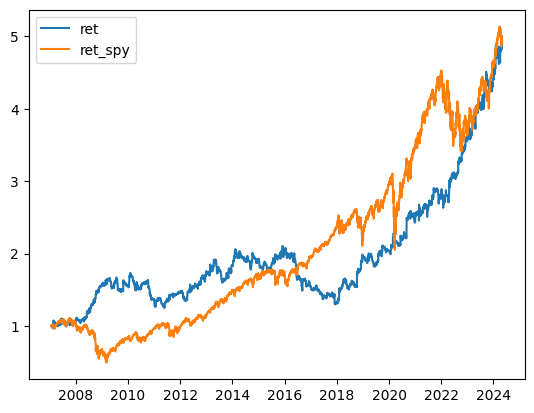

In [23]:
strat[['ret', 'ret_spy']].add(1).cumprod().plot()